In [64]:
import pandas as pd
import numpy as np
import os
import json

# Leer textos e hipótesis <T,H>

In [65]:
df = pd.read_csv("train_dev_test.csv")
df

,Unnamed: 0,gold_label,sentence1,sentence2,SET
0,0,neutral,A person on a horse jumps over a broken down a...,A person is training his horse for a competition.,TRAIN
1,1,contradiction,A person on a horse jumps over a broken down a...,"A person is at a diner, ordering an omelette.",TRAIN
2,2,entailment,A person on a horse jumps over a broken down a...,"A person is outdoors, on a horse.",TRAIN
3,3,neutral,Children smiling and waving at camera,They are smiling at their parents,TRAIN
4,4,entailment,Children smiling and waving at camera,There are children present,TRAIN
...,...,...,...,...,...
569022,559186,contradiction,Two women are observing something together.,Two women are standing with their eyes closed.,TEST
569023,559187,entailment,Two women are observing something together.,Two girls are looking at something.,TEST
569024,559188,contradiction,A man in a black leather jacket and a book in ...,A man is flying a kite.,TEST
569025,559189,entailment,A man in a black leather jacket and a book in ...,A man is speaking in a classroom.,TEST


In [66]:
df_test= df[df["SET"]=="TEST"]
df_test

,Unnamed: 0,gold_label,sentence1,sentence2,SET
559209,549367,neutral,This church choir sings to the masses as they ...,The church has cracks in the ceiling.,TEST
559210,549368,entailment,This church choir sings to the masses as they ...,The church is filled with song.,TEST
559211,549369,contradiction,This church choir sings to the masses as they ...,A choir singing at a baseball game.,TEST
559212,549370,neutral,"A woman with a green headscarf, blue shirt and...",The woman is young.,TEST
559213,549371,entailment,"A woman with a green headscarf, blue shirt and...",The woman is very happy.,TEST
...,...,...,...,...,...
569022,559186,contradiction,Two women are observing something together.,Two women are standing with their eyes closed.,TEST
569023,559187,entailment,Two women are observing something together.,Two girls are looking at something.,TEST
569024,559188,contradiction,A man in a black leather jacket and a book in ...,A man is flying a kite.,TEST
569025,559189,entailment,A man in a black leather jacket and a book in ...,A man is speaking in a classroom.,TEST


In [67]:
prueba = df_test.sample(n=100, random_state=123)
prueba

,Unnamed: 0,gold_label,sentence1,sentence2,SET
568111,558275,entailment,"A man wearing a blue shirt, black apron, eyegl...",A person in appropriate institution protection...,TEST
568812,558976,entailment,A man dressed in a red shirt and black tie sta...,a guy in a red top and tie makes a speech,TEST
560781,550939,contradiction,A young boy runs across a road in front of a s...,A boy sleeps in his bed.,TEST
565799,555963,contradiction,An Asian woman is standing on a path with a ba...,Nobody is standing,TEST
562665,552829,neutral,A child in a maroon shirt playing next to a fo...,The child is getting wet from the fountain.,TEST
...,...,...,...,...,...
567068,557232,entailment,"A group of men in blue shirts, banded hats, an...",a bunch of guys in colorful clothes stand toge...,TEST
568650,558814,entailment,A woman holding a newborn baby.,woman holds baby,TEST
559485,549643,contradiction,A skateboarding youth does a trick on a rail.,A man painting a tree.,TEST
559755,549913,contradiction,Four children are playing in some water.,The children are doing chores.,TEST


In [68]:
prueba=pd.read_csv("prueba.csv")

In [69]:
textos = prueba["sentence1"].to_list()
hipotesis = prueba["sentence2"].to_list()
print(textos)
print(hipotesis)

['A man wearing a blue shirt, black apron, eyeglasses, and a mask is handling food in a tray.', 'A man dressed in a red shirt and black tie stands up at a wedding reception to make a speech.', 'A young boy runs across a road in front of a sky blue building with barred windows.', 'An Asian woman is standing on a path with a basket on her head looking into a mirror she is holding in her hand.', 'A child in a maroon shirt playing next to a fountain.', 'man dressed in orange clothing with face covered seemingly balancing on a cane being held be a similarly dressed man sitting crossed legged on the ground at a shopping mall.', 'An old man with a package poses in front of an advertisement.', 'People dressed in traditional Japanese garb walk in a procession through a courtyard paved with paving stones.', 'Two children play in the snow by the side of the road.', 'Blond-haired girl wearing a bicycle helmet, a black t-shirt that reads "Twizzlers" and a printed dog tag necklace around her neck.',

In [70]:
hipotesis

['A person in appropriate institution protection works with meals.',
 'a guy in a red top and tie makes a speech',
 'A boy sleeps in his bed.',
 'Nobody is standing',
 'The child is getting wet from the fountain.',
 'Two clowns are performing at a mall.',
 'A man poses in front of an ad for beer.',
 'People dressed in Japanese clothing walk through a courtyard.',
 'Kids are enjoying the cold weather.',
 'a girl with a helmet wears a dog tag',
 'A fat woman is wearing pants.',
 'two men cut grass by hand',
 'Two people are drumming.',
 'A person drives away in a winnebago.',
 'Woman takes a break at a museum while her children sit by her feet.',
 'The child on the swing is a girl.',
 'A man is kissing a woman',
 'Someone is having a picnic near the lake.',
 'a woman holding a scruffy cat',
 'A woman is preparing food for a child.',
 'A woman standing at a microphone',
 'A girl is wearing a hat.',
 'A young gymnast is performing.',
 'There is a guy with a basketball.',
 'Girls are making

In [71]:
import spacy

nlp = spacy.load("en_core_web_md")

In [73]:
textos

['A man wearing a blue shirt, black apron, eyeglasses, and a mask is handling food in a tray.',
 'A man dressed in a red shirt and black tie stands up at a wedding reception to make a speech.',
 'A young boy runs across a road in front of a sky blue building with barred windows.',
 'An Asian woman is standing on a path with a basket on her head looking into a mirror she is holding in her hand.',
 'A child in a maroon shirt playing next to a fountain.',
 'man dressed in orange clothing with face covered seemingly balancing on a cane being held be a similarly dressed man sitting crossed legged on the ground at a shopping mall.',
 'An old man with a package poses in front of an advertisement.',
 'People dressed in traditional Japanese garb walk in a procession through a courtyard paved with paving stones.',
 'Two children play in the snow by the side of the road.',
 'Blond-haired girl wearing a bicycle helmet, a black t-shirt that reads "Twizzlers" and a printed dog tag necklace around he

# Enriquecer grafo con wordnet,
## Primero lo hacemos con hiperonimos de acuerdo a la caracteristicas de Generalidad

In [74]:
import nltk, re, os
from nltk.corpus import wordnet as wn

In [84]:
def tokenizar(texto,nlp,wn,hipotesis=False):
    sinonimos=set()
    #print(texto)
    lista=[]
    doc = nlp(texto)
    l=[]
    validados=[]
    for token in doc:
        #print(token.text, token.pos_,token.dep_, token.head.text, token.head.pos_)
        #print(str(token.pos_))
        if str(token.pos_):
            #print(token.text,token.pos_)
            sinonimos=set()
            if(token.pos_ == 'NOUN' or token.pos_ == 'PRON'):
                w =wn.synsets(token.text,wn.NOUN)                
            elif(token.pos_ == 'VERB'):
                w =wn.synsets(token.text,wn.VERB)
            elif(token.pos_ == 'ADJ'):
                w =wn.synsets(token.text,wn.ADJ)
            elif(token.pos_ == 'ADV'):
                w =wn.synsets(token.text,wn.ADV)
            else:
                w =wn.synsets(token.text)
            if token.text in validados:
                for child in token.children:
                    if child.pos_ not in ['PUNCT','DET','AUX','CCONJ']:
                        lista.append((str(token.text)+","+str(token.pos_),str(child.text)+","+str(child.pos_)))
                        print(token.text, token.pos_,token.dep_, token.head.text, token.head.pos_)
            else:
                for child in token.children:
                    if child.pos_ not in ['PUNCT','DET','AUX','CCONJ']:
                        lista.append((str(token.text)+","+str(token.pos_),str(child.text)+","+str(child.pos_)))
                        print(token.text, token.pos_,token.dep_, token.head.text, token.head.pos_)
            l=set(lista)
            validados.append(token.text)
    return list(l)

In [76]:
#from spacy import displacy
nlp = spacy.load("en_core_web_md")
doc = nlp(textos[5])
print(textos[5])
lista_vinc=[]
for token in doc:
    print(token.text,token.pos_)
    if (token.pos_ =="NOUN"):
        for child in token.children:
            if(child.pos_ =="ADJ"):
                #print(child.text,child.pos_,token.text,token.pos_)
                lista_vinc.append((child.text,child.pos_,token.text,token.pos_))
            elif(child.pos_ =="ADP"):
                #print(child.text,child.pos_,token.text,token.pos_)
                lista_vinc.append((child.text,child.pos_,token.text,token.pos_))
            elif(child.pos_ =="VERB"):
                #print(token.text,token.pos_,child.text,child.pos_)
                lista_vinc.append((token.text,token.pos_,child.text,child.pos_))
                for childe in child.children:
                    if(childe.pos_ in ["NOUN","ADP"]):
                        #print("sutantivo derivasdo",childe.text,child.text)
                        lista_vinc.append((child.text,child.pos_,childe.text,childe.pos_))
                        for childe2 in childe.children:
                            if(childe2.pos_ in ["NOUN","ADP"]):
                                #print("sutantivo derivasdo",childe2.text,child.text)
                                lista_vinc.append((child.text,child.pos_,childe2.text,childe2.pos_))
                                for childe3 in childe2.children:
                                    if(childe3.pos_ in ["NOUN","ADP"]):
                                        #print("sutantivo derivasdo",childe2.text,child.text)
                                        lista_vinc.append((child.text,child.pos_,childe3.text,childe3.pos_))
                                        for childe4 in childe3.children:
                                            if(childe4.pos_ in ["NOUN","ADP"]):
                                            #print("sutantivo derivasdo",childe2.text,child.text)
                                                lista_vinc.append((child.text,child.pos_,childe4.text,childe4.pos_))
                    elif(childe.pos_ in ["ADP","AUX"]):
                        #print("sutantivo derivasdo",childe.text,child.text)
                        for childe2 in childe.children:
                            if(childe2.pos_=="NOUN"):
                                #print("sutantivo derivasdo",childe2.text,child.text)
                                lista_vinc.append((child.text,child.pos_,childe2.text,childe2.pos_))
                                for childe3 in childe2.children:
                                    if(childe3.pos_=="NOUN"):
                                        #print("sutantivo derivasdo",childe2.text,child.text)
                                        lista_vinc.append((child.text,child.pos_,childe3.text,childe3.pos_))
                                        for childe4 in childe3.children:
                                            if(childe4.pos_=="NOUN"):
                                            #print("sutantivo derivasdo",childe2.text,child.text)
                                                lista_vinc.append((child.text,child.pos_,childe4.text,childe4.pos_))
                    
            elif(child.pos_ not in ["ADP","CCONJ","PUNCT","DET","NOUN"]):
                print("sutantivo",token.text,child.text)
        #for ances in token.ancestors:
        #    if(ances.pos_ in ["VERB"]):
        #        print("verb de sustantivo acnesctor",token.text,token.pos_,ances.text,ances.pos_)
    elif (token.pos_ =="VERB"):
        print("verbos:",token.text)
        #for childr in token.ancestors:
        #     #print(token.text, token.pos_,token.dep_, token.head.text, token.head.pos_)
        #     print("verb de sustantivo acnesctor",token.text,token.pos_,childr.text,childr.pos_)
        for child in token.children:
            #print(token.text, token.pos_,token.dep_, token.head.text, token.head.pos_)
            if child.pos_ in ["NOUN","ADP"]:
                print("verb de sustantivo",child.text,child.pos_,token.text,token.pos_)
                if (token.text,token.pos_,child.text,child.pos_) not in lista_vinc:
                    lista_vinc.append((child.text,child.pos_,token.text,token.pos_))
            elif child.pos_ in ["VERB"]:
                if (token.text,token.pos_,child.text,child.pos_) not in lista_vinc:
                    lista_vinc.append((child.text,child.pos_,token.text,token.pos_))
            for childe2 in child.children:
                if(childe2.pos_ in ["NOUN","ADP"]):
                    lista_vinc.append((childe2.text,childe2.pos_,token.text,token.pos_))
print(lista_vinc)

man dressed in orange clothing with face covered seemingly balancing on a cane being held be a similarly dressed man sitting crossed legged on the ground at a shopping mall.
man NOUN
dressed VERB
verbos: dressed
verb de sustantivo in ADP dressed VERB
verb de sustantivo with ADP dressed VERB
in ADP
orange ADJ
clothing NOUN
with ADP
face NOUN
covered VERB
verbos: covered
verb de sustantivo man NOUN covered VERB
seemingly ADV
balancing VERB
verbos: balancing
verb de sustantivo on ADP balancing VERB
on ADP
a DET
cane NOUN
being AUX
held VERB
verbos: held
be AUX
a DET
similarly ADV
dressed VERB
verbos: dressed
man NOUN
sitting VERB
verbos: sitting
crossed VERB
verbos: crossed
verb de sustantivo at ADP crossed VERB
legged ADJ
on ADP
the DET
ground NOUN
at ADP
a DET
shopping NOUN
mall NOUN
. PUNCT
[('man', 'NOUN', 'dressed', 'VERB'), ('dressed', 'VERB', 'in', 'ADP'), ('dressed', 'VERB', 'clothing', 'NOUN'), ('dressed', 'VERB', 'with', 'ADP'), ('dressed', 'VERB', 'face', 'NOUN'), ('clothing', 

In [77]:
import spacy
#from spacy import displacy

#nlp = spacy.load("en_core_web_md")
#doc = nlp("man dressed in orange clothing with face covered seemingly balancing on a cane being held be a similarly dressed man sitting crossed legged on the ground at a shopping mall.")
#displacy.serve(doc, style="dep")

# Inicio de proceso de grafos

In [85]:
tripleta=5
print(len(textos))

100


In [86]:
vinculos2T=[]
vinculos2T.extend(tokenizar(textos[tripleta],nlp,wn))
vinculos2T

man NOUN nsubj covered VERB
dressed VERB acl man NOUN
dressed VERB acl man NOUN
in ADP prep dressed VERB
clothing NOUN pobj in ADP
with ADP prep dressed VERB
covered VERB ROOT covered VERB
covered VERB ROOT covered VERB
balancing VERB xcomp covered VERB
balancing VERB xcomp covered VERB
on ADP prep balancing VERB
cane NOUN pobj on ADP
be AUX conj covered VERB
dressed VERB amod man NOUN
man NOUN attr be AUX
man NOUN attr be AUX
man NOUN attr be AUX
crossed VERB acl man NOUN
crossed VERB acl man NOUN
legged ADJ oprd crossed VERB
on ADP prep legged ADJ
at ADP prep crossed VERB
mall NOUN pobj at ADP


[('cane,NOUN', 'held,VERB'),
 ('on,ADP', 'cane,NOUN'),
 ('with,ADP', 'face,NOUN'),
 ('crossed,VERB', 'legged,ADJ'),
 ('balancing,VERB', 'on,ADP'),
 ('mall,NOUN', 'shopping,NOUN'),
 ('dressed,VERB', 'similarly,ADV'),
 ('crossed,VERB', 'at,ADP'),
 ('man,NOUN', 'dressed,VERB'),
 ('man,NOUN', 'sitting,VERB'),
 ('covered,VERB', 'man,NOUN'),
 ('be,AUX', 'man,NOUN'),
 ('man,NOUN', 'crossed,VERB'),
 ('on,ADP', 'ground,NOUN'),
 ('dressed,VERB', 'in,ADP'),
 ('in,ADP', 'clothing,NOUN'),
 ('dressed,VERB', 'with,ADP'),
 ('covered,VERB', 'balancing,VERB'),
 ('balancing,VERB', 'seemingly,ADV'),
 ('clothing,NOUN', 'orange,ADJ'),
 ('legged,ADJ', 'on,ADP'),
 ('at,ADP', 'mall,NOUN')]

In [87]:
vinculos2H=[]
vinculos2H.extend(tokenizar(hipotesis[tripleta],nlp,wn,hipotesis=True))
#vinculos2H.extend(tokenizar((estH['SUB'].strip()+" "+estH['VERBM'].strip()+" "+estH['VERB'].strip()),nlp,wn))
#vinculos2H.extend(tokenizar(estH['VERB']+" "+estH['OBJ'],nlp,wn))
vinculos2H

clowns NOUN nsubj performing VERB
performing VERB ROOT performing VERB
performing VERB ROOT performing VERB
at ADP prep performing VERB


[('performing,VERB', 'clowns,NOUN'),
 ('performing,VERB', 'at,ADP'),
 ('at,ADP', 'mall,NOUN'),
 ('clowns,NOUN', 'Two,NUM')]

In [88]:
vinculos2T

[('cane,NOUN', 'held,VERB'),
 ('on,ADP', 'cane,NOUN'),
 ('with,ADP', 'face,NOUN'),
 ('crossed,VERB', 'legged,ADJ'),
 ('balancing,VERB', 'on,ADP'),
 ('mall,NOUN', 'shopping,NOUN'),
 ('dressed,VERB', 'similarly,ADV'),
 ('crossed,VERB', 'at,ADP'),
 ('man,NOUN', 'dressed,VERB'),
 ('man,NOUN', 'sitting,VERB'),
 ('covered,VERB', 'man,NOUN'),
 ('be,AUX', 'man,NOUN'),
 ('man,NOUN', 'crossed,VERB'),
 ('on,ADP', 'ground,NOUN'),
 ('dressed,VERB', 'in,ADP'),
 ('in,ADP', 'clothing,NOUN'),
 ('dressed,VERB', 'with,ADP'),
 ('covered,VERB', 'balancing,VERB'),
 ('balancing,VERB', 'seemingly,ADV'),
 ('clothing,NOUN', 'orange,ADJ'),
 ('legged,ADJ', 'on,ADP'),
 ('at,ADP', 'mall,NOUN')]

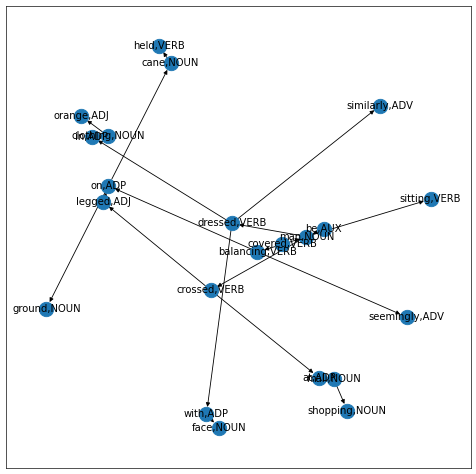

In [89]:
import networkx as nx
from matplotlib import pyplot as plt
fig = plt.figure(1, figsize=(10, 10), dpi=60)
G = nx.DiGraph()
G.add_edges_from(vinculos2T)
#G.add_edge(1, 2)  # default edge data=1
#G.add_edge(2, 3, weight=0.9)  # specify edge data
nx.draw_networkx(G)

In [90]:
vinculos2H

[('performing,VERB', 'clowns,NOUN'),
 ('performing,VERB', 'at,ADP'),
 ('at,ADP', 'mall,NOUN'),
 ('clowns,NOUN', 'Two,NUM')]

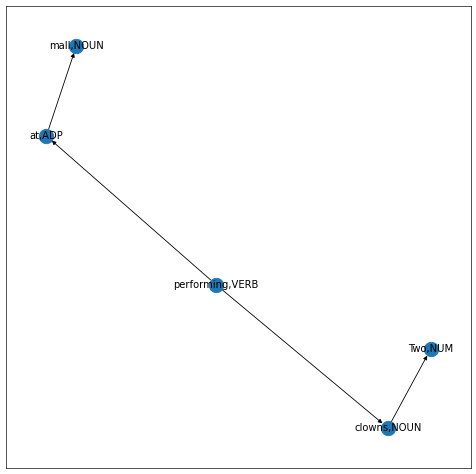

In [91]:
import networkx as nx
GH = nx.DiGraph()
fig = plt.figure(1, figsize=(10, 10), dpi=60)
GH.add_edges_from(vinculos2H)
#G.add_edge(1, 2)  # default edge data=1
#G.add_edge(2, 3, weight=0.9)  # specify edge data
nx.draw_networkx(GH)

In [92]:
textos[tripleta]

'man dressed in orange clothing with face covered seemingly balancing on a cane being held be a similarly dressed man sitting crossed legged on the ground at a shopping mall.'

In [93]:
hipotesis[tripleta]

'Two clowns are performing at a mall.'

# Modelo de inferencia de relaciones

In [94]:
def revision(hipot,texts,wn,GH,G):
    faltantes = []
    existentes=[]
    relacion = []
    h_ = nlp(hipot)
    print("Texto: ",texts)
    print("Hipótesis: ",h_)
    print()
    for t in h_:
        p=t.pos_
        w=t.text
        wl=t.lemma_
        word=t.text+","+t.pos_
        word_l=t.lemma_+","+t.pos_
        print(word,word_l,p,w)
        if p in ["NOUN","ADJ","VERB","ADV","PRON"]:
            if word in GH:
                if word in G:
                    print("El token: ",word," se encuentra en el Texto")
                    preds=GH.predecessors(word)
                    for e in preds:
                        po=e.split(",")
                        if(po[-1]=="NOUN"):
                            relacion.append((e,word))
                    existentes.append((word,word,1.0))
                elif w+",H" in G:
                    print("Hiperonimo",w)
                    su=G.successors(w+",H")
                    for e in su:
                        existentes.append((e,w+",H",1.0))
                        break
                    print("Principal en texto: ",e)
                    su=G.successors(e)
                    for ei in su:
                        print(ei)
                    print("Principal en Hipotesis: ",word)
                    su=GH.successors(word)
                    for ei in su:
                        print(ei)
                elif w+",S" in G:
                    print("Sinonimo",w)
                    su=G.successors(w+",S")
                    for e in su:
                        existentes.append((e,w+",S",1.0))
                        break
                    sin =[]
                    su=G.successors(w)
                elif w+",A" in G:
                    print("Atributo",w)
                    su=G.predecessors(w+",A")
                    for e in su:
                        existentes.append((e,w+",A",1.0))
                        break
                elif wl+",H" in G:
                    print("Hiperonimo l",wl)
                    su=G.successors(wl+",H")
                    for e in su:
                        existentes.append((e,wl+",H",1.0))
                        break
                elif wl+",S" in G:
                    print("Sinonimo l",wl)
                    su=G.successors(wl+",S")
                    for e in su:
                        existentes.append((e,wl+",S",1.0))
                        break
                elif wl+",A" in G:
                    print("Atributo l",wl)
                    su=G.predecessors(wl+",A")
                    for e in su:
                        existentes.append((e,wl+",A",1.0))
                        break
                elif w+",VERB" in G:
                    print("Checar",w,p)
                elif word_l in G:
                    print("El token lematizado : ",word_l," se encuentra en el Texto")
                    preds2=G.successors(word_l)
                    preds=GH.successors(word)
                    sucesT=[]
                    sucesH=[]
                    for e in preds2:
                        sucesT.append(e)
                    for e in preds:
                        sucesH.append(e)
                        po=e.split(",")
                        if(po[-1]=="NOUN"):
                            relacion.append((e,word_l))
                    existentes.append((word,word_l,1.0))
                    print("Token vinculados con: ",word_l,set(sucesT).intersection(set(sucesH)))
                        #lista_vecinos = [n for n in GH.neighbors(t.text+","+t.pos_)]
                        #print(lista_vecinos)
                        #for v in lista_vecinos:
                        #    if(v in G):
                        #        print(v)
                else:
                    lista_vecinos = [n for n in GH.neighbors(word)]
                    #print(lista_vecinos)
                    print("El token: ",word," no se encuentra en el Texto")
                    sin =[]
                    if w+",S" in G:
                        su=G.predecessors(w+",S")
                        for e in su:
                            sin.append(e)
                    elif w+",H" in G:
                        su=G.predecessors(w+",H")
                        for e in su:
                            sin.append(e)
                    if w+",A" in G:
                        su=G.predecessors(w+",A")
                        for e in su:
                            sin.append(e)
                    print("a buscar",word,sin)
                    faltantes.append(word)
            else:
                print("No esta en grafo H:",word)
        elif p in ["NUM","DET"]:
            numero_s=p
            print(numero_s)
        else:
            print(word)
    print()
    print("Existentes",existentes)
    print("Faltantes",faltantes)
    print("Relaciones a buscar",relacion)
    print()
    razonamiento=[]
    print("***************************************+")
    print("Proceso de inferencia")
    #faltantes de las relaciones
    for tupla in relacion:
        #print(tupla)
        #print(tupla[0])
        b=tupla[1]
        a=GH.neighbors(tupla[0]) ## Vecinos con sinonimos o atributos
        for e in a:
            #print(e)
            g=e.split(",")
            #print(g[-1])
            if g[-1]=="A" and g[0]!="the" and e in G:
                #print("asdad",e)
                #lista_v = G.predecessors(e) #G.neighbors(e) #A partir del atributo buscamos el sustantivo principal
                #print("pred")
                for n in G.predecessors(e):
                    kj=n.split(",")
                    if(kj[-1]=="NOUN"):
                        ais=str(tupla[0].split(",")[0])
                        bis=str(kj[0])
                        w1_ = wn.synsets(ais)
                        w2_ = wn.synsets(bis)
                        maxi=0
                        for a in w1_:
                            for b in w2_:
                                if a.wup_similarity(b)>maxi:
                                    maxi=a.wup_similarity(b)
                                    #print(a,b,maxi)
                                    if maxi>=0.8:
                                        #print(a,"->",b)
                                        #print(a,a.definition())
                                        #print(b,b.definition())
                                        #print(tupla[0],n,a.wup_similarity(b))
                                        razonamiento.append((a,"->",b,b.definition(),a.wup_similarity(b)))
                                        #print(a,a.definition())
                                        #print(b,b.definition())
                                        #print(tupla[0],n,a.wup_similarity(b))
                #for lv in lista_v:
                #    print("G",lista_v[lv])
                #    print()
        #for t in d_:
            #lista_vecinos= [n for n in G.neighbors(t.text+","+t.pos_)]
            #print(lista_vecinos)


    print(set(razonamiento))
    return existentes,faltantes

In [96]:
def revision2(hipot,texts,wn,GH,G):
    faltantes = []
    existentes=[]
    relacion = []
    #for k in estH.keys():
    #    print(estH[k])
    #    d_ = nlp(str(estH[k]))
    h_ = nlp(hipot)
    print("Texto: ",texts)
    print("Hipótesis: ",h_)
    print()
    for t in h_:
        p=t.pos_
        w=t.text
        wl=t.lemma_
        word=t.text+","+t.pos_
        word_l=t.lemma_+","+t.pos_
        print(word,word_l,p,w)
        if p in ["NOUN"]:
            if word in GH:
                if word in G:
                    print("El token: ",word," se encuentra en el Texto")
                    preds=GH.predecessors(word)
                    for e in preds:
                        po=e.split(",")
                        if(po[-1]=="NOUN"):
                            relacion.append((e,word))
                    existentes.append((word,word,1.0))
                elif w+",H" in G:
                    print("Hiperonimo",w)
                    su=G.successors(w+",H")
                    for e in su:
                        existentes.append((e,w+",H",1.0))
                    #print("Principal en texto: ",e)
                    #su=GH.successors(e)
                    #for ei in su:
                    #    po=ei.split(",")
                    #    if(po[-1]=="A"):
                    #        relacion.append((ei,e))
                    print("Principal en Hipotesis: ",word)
                    su=GH.successors(word)
                    for ei in su:
                        po=ei.split(",")
                        if(po[-1]=="ADJ"):
                            relacion.append((ei,e))
                elif w+",S" in G:
                    print("Sinonimo",w)
                    su=G.successors(w+",S")
                    for e in su:
                        existentes.append((e,w+",S",1.0))
                        break
                    sin =[]
                    su=G.successors(w)
                elif w+",A" in G:
                    print("Atributo",w)
                    su=G.predecessors(w+",A")
                    for e in su:
                        existentes.append((e,w+",A",1.0))
                        break
                elif wl+",H" in G:
                    print("Hiperonimo l",wl)
                    su=G.successors(wl+",H")
                    for e in su:
                        existentes.append((e,wl+",H",1.0))
                        break
                elif wl+",S" in G:
                    print("Sinonimo l",wl)
                    su=G.successors(wl+",S")
                    for e in su:
                        existentes.append((e,wl+",S",1.0))
                        break
                elif wl+",A" in G:
                    print("Atributo l",wl)
                    su=G.predecessors(wl+",A")
                    for e in su:
                        existentes.append((e,wl+",A",1.0))
                        break
                elif w+",VERB" in G:
                    print("Checar",w,p)
                elif word_l in G:
                    print("El token lematizado : ",word_l," se encuentra en el Texto")
                    preds2=G.successors(word_l)
                    preds=GH.successors(word)
                    sucesT=[]
                    sucesH=[]
                    for e in preds2:
                        sucesT.append(e)
                    for e in preds:
                        sucesH.append(e)
                        po=e.split(",")
                        if(po[-1]=="NOUN"):
                            relacion.append((e,word_l))
                    existentes.append((word,word_l,1.0))
                    print("Token vinculados con: ",word_l,set(sucesT).intersection(set(sucesH)))
                        #lista_vecinos = [n for n in GH.neighbors(t.text+","+t.pos_)]
                        #print(lista_vecinos)
                        #for v in lista_vecinos:
                        #    if(v in G):
                        #        print(v)
                else:
                    lista_vecinos = [n for n in GH.neighbors(word)]
                    #print(lista_vecinos)
                    print("El token: ",word," no se encuentra en el Texto")
                    sin =[]
                    if w+",S" in G:
                        su=G.predecessors(w+",S")
                        for e in su:
                            sin.append(e)
                    elif w+",H" in G:
                        su=G.predecessors(w+",H")
                        for e in su:
                            sin.append(e)
                    if w+",A" in G:
                        su=G.predecessors(w+",A")
                        for e in su:
                            sin.append(e)
                    print("a buscar",word,sin)
                    faltantes.append(word)
            else:
                print("No esta en grafo H:",word)
        elif p in ["ADJ","VERB","ADV","PRON"]:
            print(p)
        elif p in ["NUM","DET"]:
            numero_s=p
            print("Conteo: ",numero_s)
        else:
            print(word)
    print()
    print("Existentes",existentes)
    print("Faltantes",faltantes)
    print("Relaciones a buscar",relacion)
    print()
    razonamiento=[]
    print("***************************************+")
    print("Proceso de inferencia")
    
    #faltantes de las relaciones
    for tupla in relacion:
        print("relación:",tupla[0])
        a=tupla[0]
        #b=G.predecessors(tupla[1]) ## Vecinos con sinonimos o atributos
        #for e in b:
        #    print("predecesor:",e,tupla[1])
        b=G.neighbors(tupla[1]) ## Vecinos con sinonimos o atributos
        for e in b:
            print("neigbor",e,tupla[1])
            kj=e.split(",")
            #if e in GH and g[0] not in ["the","at","in"]:
            #    print("lo encontramos",e)
            ais=str(tupla[0].split(",")[0])
            bis=str(kj[0])
            w1_ = wn.synsets(ais,wn.ADJ)
            w2_ = wn.synsets(bis,wn.ADJ)
            maxi=0
            for a in w1_:
                for b in w2_:
                    if a.wup_similarity(b)>maxi:
                        maxi=a.path_similarity(b)
                        print(a,b,maxi)
                        if maxi>=0.8:
                            razonamiento.append((a,"->",b,b.definition(),a.wup_similarity(b)))
            
        #b=G.successors(tupla[1]) ## Vecinos con sinonimos o atributos
        #for e in b:
        #    print("sucesor:",e,tupla[1])

    print("Fin Proceso de inferencia")
    print(set(razonamiento))
    return existentes,faltantes

In [97]:
def inferencia(existentes,faltantes,texts,wn):
    suma=0    
    falt=faltantes[:]
    print("entrardas:",faltantes)
    p1=''
    p2=''
    for tupla in faltantes:
        palabra1=''
        palabra2=''
        t_ = nlp(texts)
        tk=tupla.split(",")
        
        print(tk[0],tk[1])
        max_r=0
        max_root=0
        max_lch=0
        cam_sh=0
        for tk_ in t_:
            sim=0
            p=tk_.pos_
            word=tk_.text
            word_l=tk_.lemma_+","+tk_.pos_
            #print(tk_.text)
            #print(word,p)
            if p == "VERB":
                w1=wn.synsets(word,wn.VERB)
            elif p == "NOUN" or p=="PRON":
                w1=wn.synsets(word,wn.NOUN)
            elif p == "ADJ":
                w1=wn.synsets(word,wn.ADJ)
            elif p == "ADV":
                w1=wn.synsets(word,wn.ADV)
            else:
                w1=wn.synsets(word)
            #print(tk[0],tk[1])
            if tk[1] == "VERB":
                w2=wn.synsets(tk[0],wn.VERB)
            elif tk[1] == "NOUN" or p=="PRON":
                w2=wn.synsets(tk[0],wn.NOUN)
            elif tk[1] == "ADJ":
                w2=wn.synsets(tk[0],wn.ADJ)
            elif tk[1] == "ADV":
                w2=wn.synsets(tk[0],wn.ADV)
            else:
                w2=wn.synsets(tk[0])
            print("palabras a revisar",w1,w2)
            for a in w1:
                for b in w2:
                    if tk[1] not in ["ADP","AUX","DET"] and p not in ["ADP","AUX","DET"]:
                            sim=a.wup_similarity(b)
                            print(tk[0],word,a,b,a.wup_similarity(b),b.path_similarity(a),max_r)#,a.lch_similarity(b))
                            if sim>max_r:
                                #print("entra")
                                sim_h=b.path_similarity(a, simulate_root=False)
                                if sim_h!=None:
                                    #if(p=='NOUN' and tk[1]=="NOUN"):
                                    #print("lch:",a,b,a.shortest_path_distance(b))
                                    max_r=sim#+sim_h
                                    max_root=sim_h
                                    palabra1=a
                                    palabra2=b
                                    p1=word
                                    p2=tk[0]
                                    pos1=p
                                    pos2=tk[1]
                                    cam_sh=a.shortest_path_distance(b)
                                    if p==tk[1]:
                                        max_lch=a.lch_similarity(b)
                                    else:
                                        max_lch=0
                                        #print(p1,p2,max_r)
                                else:
                                    sim_h=b.path_similarity(a)    
                                    #print("sin root",sim_h)
                                    #print("POS",)
                                    if p==tk[1] and a.pos()==b.pos():
                                        max_lch=a.lch_similarity(b)
                                    else:
                                        max_lch=0
                                    cam_sh=a.shortest_path_distance(b)
                                    max_r=sim
                                    max_root=sim_h
                                    palabra1=a
                                    palabra2=b
                                    p1=word
                                    pos1=p
                                    p2=tk[0]
                                    pos2=tk[1]
                                #else:
                                #    max_r=sim
                                #    palabra1=a
                                #    palabra2=b
        print("es:", falt,type(falt))
        if type(palabra1)==type(a) and type(palabra2)==type(a):
            print("Obtenidas",palabra1,palabra1.definition(),palabra2,palabra2.definition(),max_r,max_root)  
            if max_r>=0.4:
                #if cam_sh==None:
                #    existentes.append((p1+","+pos1,p2+","+pos2,max_r-max_root,max_root,max_lch,cam_sh))
                #elif cam_sh>=5:
                #    existentes.append((p1+","+pos1,p2+","+pos2,max_r-max_root,max_root,max_lch,cam_sh))
                #else:
                #if max_lch!=0:
                existentes.append((p1+","+pos1,p2+","+pos2,max_r,max_root,max_lch,cam_sh))
                falt.remove(tupla)
            else:
                print("dasdadas:",palabra1,palabra2)
        else:
            print(p1,p2,max_r)
            print("faltante",tupla,sim)
        suma+=max_r

    # HAY UN PROBLEMA CON LOS FALTANTES YA QUE QUE NO EXISTAN QUIERE DECIR QUE LOS TOKENS SE ENCOTRARON
    # POR LO QUE HAY QUE REVISAR 
    # DEBEMOS COMPARAR EL TIPO DE PALABRAS FALTANTES CON EL TIPO DE PALABRAS QUE TENEMOS
    # TALVES SERÍA CORRECTO RELACIONAR SUSTANTIVOS CON ADJETIVOS
    # PERO REVISAR VERBOS CON UNICAMENTE VERBOS
    result=""
    print("fal",falt)
    print("existentes",existentes)
    promedio=0
    if(len(falt)==0):
        for e in existentes:
            promedio+=float(e[2])
        promedio=promedio/len(existentes)
    else:
        promedio=0.0
    
    if(promedio>0.74):
        print("Entailment",promedio)
        result="entailment"
    elif(promedio > 0.45 and promedio<=0.74):
        print("Neutral",promedio)
        result="neutral"
    else:
        print("Contradiction",promedio)
        result="contradiction"
    return result,existentes,falt

In [99]:
import networkx as nx
resultados=[]
relaciones_finales=[]
faltantes_finales=[]
length=len(textos)
#length=[3]
for i in range(length):
#for i in length:
    print(i)
    vinculos2T=[]
    vinculos2H=[]
    vinculos2T.extend(tokenizar(textos[i],nlp,wn))
    vinculos2H.extend(tokenizar(hipotesis[i],nlp,wn,hipotesis=True))
    G = nx.DiGraph()
    G.add_edges_from(vinculos2T)
    GH = nx.DiGraph()
    GH.add_edges_from(vinculos2H)
    e,f=revision(hipotesis[i],textos[i],wn,GH,G)
    res,relf,fal=inferencia(e,f,textos[i],wn)
    resultados.append(res)
    faltantes_finales.append(fal)
    relaciones_finales.append(relf)

0
man NOUN nsubj handling VERB
wearing VERB acl man NOUN
shirt NOUN dobj wearing VERB
shirt NOUN dobj wearing VERB
apron NOUN conj shirt NOUN
apron NOUN conj shirt NOUN
handling VERB ROOT handling VERB
handling VERB ROOT handling VERB
handling VERB ROOT handling VERB
handling VERB ROOT handling VERB
in ADP prep handling VERB
person NOUN nsubj works VERB
in ADP prep person NOUN
protection NOUN pobj in ADP
protection NOUN pobj in ADP
works VERB ROOT works VERB
works VERB ROOT works VERB
with ADP prep works VERB
Texto:  A man wearing a blue shirt, black apron, eyeglasses, and a mask is handling food in a tray.
Hipótesis:  A person in appropriate institution protection works with meals.

A,DET a,DET DET A
DET
person,NOUN person,NOUN NOUN person
El token:  person,NOUN  no se encuentra en el Texto
a buscar person,NOUN []
in,ADP in,ADP ADP in
in,ADP
appropriate,ADJ appropriate,ADJ ADJ appropriate
El token:  appropriate,ADJ  no se encuentra en el Texto
a buscar appropriate,ADJ []
institution,N

In [101]:
resultados

['entailment',
 'entailment',
 'contradiction',
 'entailment',
 'entailment',
 'neutral',
 'entailment',
 'entailment',
 'neutral',
 'entailment',
 'entailment',
 'neutral',
 'entailment',
 'entailment',
 'entailment',
 'entailment',
 'entailment',
 'entailment',
 'entailment',
 'entailment',
 'entailment',
 'entailment',
 'neutral',
 'neutral',
 'entailment',
 'entailment',
 'entailment',
 'entailment',
 'entailment',
 'neutral',
 'contradiction',
 'entailment',
 'entailment',
 'neutral',
 'contradiction',
 'contradiction',
 'entailment',
 'contradiction',
 'contradiction',
 'contradiction',
 'contradiction',
 'entailment',
 'entailment',
 'neutral',
 'neutral',
 'entailment',
 'contradiction',
 'entailment',
 'neutral',
 'neutral',
 'entailment',
 'entailment',
 'neutral',
 'entailment',
 'entailment',
 'entailment',
 'neutral',
 'contradiction',
 'entailment',
 'contradiction',
 'entailment',
 'entailment',
 'entailment',
 'entailment',
 'entailment',
 'entailment',
 'entailment',
 

In [102]:
relaciones_finales

[[('man,NOUN', 'person,NOUN', 0.8, 0.5, 2.9444389791664407, 1),
  ('wearing,VERB', 'appropriate,ADJ', 0.5, 0.3333333333333333, 0, None),
  ('mask,NOUN',
   'institution,NOUN',
   0.6666666666666666,
   0.16666666666666666,
   1.845826690498331,
   5),
  ('mask,NOUN',
   'protection,NOUN',
   0.9333333333333333,
   0.5,
   2.9444389791664407,
   1),
  ('handling,VERB', 'works,VERB', 0.8, 0.5, 2.5649493574615367, 1),
  ('food,NOUN',
   'meals,NOUN',
   0.8333333333333334,
   0.3333333333333333,
   2.538973871058276,
   2)],
 [('red,ADJ', 'red,ADJ', 1.0),
  ('makes,VERB', 'make,VERB', 1.0),
  ('speech,NOUN', 'speech,NOUN', 1.0),
  ('man,NOUN', 'guy,NOUN', 0.9473684210526315, 0.5, 2.9444389791664407, 1),
  ('shirt,NOUN', 'top,NOUN', 0.8, 0.2, 2.0281482472922856, 4),
  ('make,VERB', 'tie,VERB', 0.75, 0.3333333333333333, 2.159484249353372, 2)],
 [('boy,NOUN', 'boy,NOUN', 1.0),
  ('young,ADJ', 'sleeps,VERB', 0.4, 0.25, 0, None),
  ('front,NOUN', 'bed,NOUN', 0.8, 0.25, 2.2512917986064953, 3)],

In [103]:
faltantes_finales

[[],
 [],
 ['his,PRON'],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 ['their,PRON'],
 [],
 [],
 [],
 ['talk,VERB'],
 ['-,NOUN', 'his,PRON'],
 [],
 ['repairing,VERB'],
 ['his,PRON'],
 ['phne,NOUN'],
 ['trying,VERB'],
 [],
 [],
 [],
 [],
 [],
 ['science,NOUN'],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 ['looking,VERB'],
 [],
 ['his,PRON'],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 ['tatto,NOUN'],
 [],
 [],
 [],
 ['his,PRON'],
 ['his,PRON'],
 [],
 ['his,PRON'],
 [],
 [],
 [],
 [],
 ['reciever,NOUN'],
 ['something,PRON'],
 [],
 [],
 ['her,PRON'],
 [],
 [],
 [],
 ['their,PRON'],
 [],
 [],
 [],
 [],
 ['others,NOUN'],
 ['his,PRON'],
 [],
 [],
 [],
 ['chores,NOUN'],
 []]

In [104]:
new_prueba = prueba.assign(relaciones=relaciones_finales)
new_prueba = new_prueba.assign(faltantes=faltantes_finales)
new_prueba = new_prueba.assign(CLASS2=resultados)
new_prueba.to_csv("resultados1_prueba.csv")
new_prueba

,Unnamed: 0.1,Unnamed: 0,gold_label,sentence1,sentence2,SET,relaciones,faltantes,CLASS2
0,568111,558275,entailment,"A man wearing a blue shirt, black apron, eyegl...",A person in appropriate institution protection...,TEST,"[(man,NOUN, person,NOUN, 0.8, 0.5, 2.944438979...",[],entailment
1,568812,558976,entailment,A man dressed in a red shirt and black tie sta...,a guy in a red top and tie makes a speech,TEST,"[(red,ADJ, red,ADJ, 1.0), (makes,VERB, make,VE...",[],entailment
2,560781,550939,contradiction,A young boy runs across a road in front of a s...,A boy sleeps in his bed.,TEST,"[(boy,NOUN, boy,NOUN, 1.0), (young,ADJ, sleeps...","[his,PRON]",contradiction
3,565799,555963,contradiction,An Asian woman is standing on a path with a ba...,Nobody is standing,TEST,"[(standing,VERB, standing,VERB, 1.0), (head,NO...",[],entailment
4,562665,552829,neutral,A child in a maroon shirt playing next to a fo...,The child is getting wet from the fountain.,TEST,"[(child,NOUN, child,NOUN, 1.0), (fountain,NOUN...",[],entailment
...,...,...,...,...,...,...,...,...,...
95,567068,557232,entailment,"A group of men in blue shirts, banded hats, an...",a bunch of guys in colorful clothes stand toge...,TEST,"[(stand,VERB, stand,VERB, 1.0), (group,NOUN, b...",[],entailment
96,568650,558814,entailment,A woman holding a newborn baby.,woman holds baby,TEST,"[(woman,NOUN, woman,NOUN, 1.0), (baby,NOUN, ba...",[],entailment
97,559485,549643,contradiction,A skateboarding youth does a trick on a rail.,A man painting a tree.,TEST,"[(youth,NOUN, man,NOUN, 0.7058823529411765, 0....",[],neutral
98,559755,549913,contradiction,Four children are playing in some water.,The children are doing chores.,TEST,"[(children,NOUN, children,NOUN, 1.0), (Four,NU...","[chores,NOUN]",contradiction


In [105]:
filtro_errores=new_prueba[(new_prueba["gold_label"]=="entailment") & (new_prueba["CLASS2"]=="neutral")]
print(filtro_errores.shape)
filtro_errores

(5, 9)


,Unnamed: 0.1,Unnamed: 0,gold_label,sentence1,sentence2,SET,relaciones,faltantes,CLASS2
33,565514,555678,entailment,A group of people celebrating in the street.,There is a celebration going on,TEST,"[(celebrating,VERB, There,PRON, 0.5, 0.3333333...",[],neutral
44,567481,557645,entailment,A shirtless man with cropped hair smokes a cig...,The man is not wearing a shirt.,TEST,"[(man,NOUN, man,NOUN, 1.0), (cropped,ADJ, wear...",[],neutral
56,567952,558116,entailment,Three people are outside.,Three people in nature.,TEST,"[(people,NOUN, people,NOUN, 1.0), (people,NOUN...",[],neutral
82,563741,553905,entailment,Two men and two women in jackets walk down a l...,There are people outside.,TEST,"[(city,NOUN, There,PRON, 0.6153846153846154, 0...",[],neutral
87,560197,550355,entailment,A Skier ski-jumping while two other skiers wat...,A skier preparing a trick,TEST,"[(Skier,PROPN, skier,NOUN, 1.0, 1.0, 0, 0), (t...",[],neutral


In [106]:
#df_res =pd.read_csv("prueba1_resultados.csv")
df_res =pd.read_csv("resultados1_prueba.csv")
df_res

,Unnamed: 0.2,Unnamed: 0.1,Unnamed: 0,gold_label,sentence1,sentence2,SET,relaciones,faltantes,CLASS2
0,0,568111,558275,entailment,"A man wearing a blue shirt, black apron, eyegl...",A person in appropriate institution protection...,TEST,"[('man,NOUN', 'person,NOUN', 0.8, 0.5, 2.94443...",[],entailment
1,1,568812,558976,entailment,A man dressed in a red shirt and black tie sta...,a guy in a red top and tie makes a speech,TEST,"[('red,ADJ', 'red,ADJ', 1.0), ('makes,VERB', '...",[],entailment
2,2,560781,550939,contradiction,A young boy runs across a road in front of a s...,A boy sleeps in his bed.,TEST,"[('boy,NOUN', 'boy,NOUN', 1.0), ('young,ADJ', ...","['his,PRON']",contradiction
3,3,565799,555963,contradiction,An Asian woman is standing on a path with a ba...,Nobody is standing,TEST,"[('standing,VERB', 'standing,VERB', 1.0), ('he...",[],entailment
4,4,562665,552829,neutral,A child in a maroon shirt playing next to a fo...,The child is getting wet from the fountain.,TEST,"[('child,NOUN', 'child,NOUN', 1.0), ('fountain...",[],entailment
...,...,...,...,...,...,...,...,...,...,...
95,95,567068,557232,entailment,"A group of men in blue shirts, banded hats, an...",a bunch of guys in colorful clothes stand toge...,TEST,"[('stand,VERB', 'stand,VERB', 1.0), ('group,NO...",[],entailment
96,96,568650,558814,entailment,A woman holding a newborn baby.,woman holds baby,TEST,"[('woman,NOUN', 'woman,NOUN', 1.0), ('baby,NOU...",[],entailment
97,97,559485,549643,contradiction,A skateboarding youth does a trick on a rail.,A man painting a tree.,TEST,"[('youth,NOUN', 'man,NOUN', 0.7058823529411765...",[],neutral
98,98,559755,549913,contradiction,Four children are playing in some water.,The children are doing chores.,TEST,"[('children,NOUN', 'children,NOUN', 1.0), ('Fo...","['chores,NOUN']",contradiction


In [107]:
aciertos2=0
errores2=0
ental=0
neutral=0
contra=0
entat_ental1=0
neut_neutral1=0
contra_contra1=0
entat_ental2=0
neut_neutral2=0
contra_contra2=0
errores2_e_n=0
errores2_e_c=0
errores2_n_c=0
errores2_n_e=0
errores2_c_e=0
errores2_c_n=0
for index,strings in df_res.iterrows():
    if strings["gold_label"]=="entailment":
        ental+=1
    elif strings["gold_label"]=="neutral":
        neutral+=1
    else:
        contra+=1    
    if strings["gold_label"]==strings["CLASS2"]:
        aciertos2+=1
        if strings["CLASS2"]=="entailment":
            entat_ental2+=1
        elif strings["CLASS2"]=="neutral":
            neut_neutral2+=1
        else:
            contra_contra2+=1
    else:
        errores2+=1
        if strings["gold_label"]=="entailment":
            if strings["CLASS2"] == "neutral":
                errores2_e_n+=1
            else:
                errores2_e_c+=1
        elif strings["gold_label"]=="neutral":
            if strings["CLASS2"] == "entailment":
                errores2_n_e+=1
            else:
                errores2_n_c+=1
        else:
            if strings["CLASS2"] == "entailment":
                errores2_c_e+=1
            else:
                errores2_c_n+=1


In [108]:
print("Aciertos CLASS2:",aciertos2/(ental+neutral+contra)," de ",(ental+neutral+contra))
print("Total entail",ental," Predict Entail", entat_ental2, entat_ental2/ental)
print("Total neutral",neutral," Predict Neutral", neut_neutral2, neut_neutral2/neutral)
print("Total contra",contra," Predict Contra", contra_contra2, contra_contra2/contra)
print("Fallas de entailment- predict neutral",errores2_e_n)
print("Fallas de entailment- predict contra",errores2_e_c)
print("Fallas de neutral- predict entail",errores2_n_e)
print("Fallas de neutral- predict contra",errores2_n_c)
print("Fallas de contra- predict entail",errores2_c_e)
print("Fallas de contra- predict neutral",errores2_c_n)

Aciertos CLASS2: 0.49  de  100
Total entail 42  Predict Entail 33 0.7857142857142857
Total neutral 31  Predict Neutral 8 0.25806451612903225
Total contra 27  Predict Contra 8 0.2962962962962963
Fallas de entailment- predict neutral 5
Fallas de entailment- predict contra 4
Fallas de neutral- predict entail 13
Fallas de neutral- predict contra 10
Fallas de contra- predict entail 13
Fallas de contra- predict neutral 6


In [109]:
df_res[(df_res["CLASS2"]=="entailment") & (df_res["gold_label"]=="neutral")]

,Unnamed: 0.2,Unnamed: 0.1,Unnamed: 0,gold_label,sentence1,sentence2,SET,relaciones,faltantes,CLASS2
4,4,562665,552829,neutral,A child in a maroon shirt playing next to a fo...,The child is getting wet from the fountain.,TEST,"[('child,NOUN', 'child,NOUN', 1.0), ('fountain...",[],entailment
6,6,559216,549374,neutral,An old man with a package poses in front of an...,A man poses in front of an ad for beer.,TEST,"[('man,NOUN', 'man,NOUN', 1.0), ('front,NOUN',...",[],entailment
10,10,561068,551226,neutral,A fat woman wearing faint blue top is blowing ...,A fat woman is wearing pants.,TEST,"[('fat,ADJ', 'fat,ADJ', 1.0), ('woman,NOUN', '...",[],entailment
14,14,565838,556002,neutral,A woman wearing a red coat stands on a wood fl...,Woman takes a break at a museum while her chil...,TEST,"[('Woman,NOUN', 'woman,NOUN', 1.0), ('her,PRON...",[],entailment
15,15,559578,549736,neutral,The sun breaks through the trees as a child ri...,The child on the swing is a girl.,TEST,"[('child,NOUN', 'child,NOUN', 1.0), ('swing,NO...",[],entailment
25,25,559430,549588,neutral,An old man in a baseball hat and an old woman ...,An old woman has a light jean jacket.,TEST,"[('old,ADJ', 'old,ADJ', 1.0), ('woman,NOUN', '...",[],entailment
41,41,564139,554303,neutral,African woman walking through field.,The african woman is looking for someone in th...,TEST,"[('woman,NOUN', 'woman,NOUN', 1.0), ('fields,N...",[],entailment
45,45,563460,553624,neutral,A group of people stares at a wall that is fil...,A group of people analyze art together,TEST,"[('group,NOUN', 'group,NOUN', 1.0), ('people,N...",[],entailment
58,58,568104,558268,neutral,A singer wearing a leather jacket performs on ...,a singer is on american idol,TEST,"[('singer,NOUN', 'singer,NOUN', 1.0)]",[],entailment
60,60,561483,551641,neutral,Two people bicycle on a path separated by smal...,Two people are in a bike race.,TEST,"[('people,NOUN', 'people,NOUN', 1.0), ('path,N...",[],entailment


In [111]:
nx.graph_edit_distance(G, GH)

21.0

In [112]:
paths, cost = nx.optimal_edit_paths(G, GH)
len(paths)

KeyboardInterrupt: 